![NYC Skyline](nyc.jpg)

Welcome to New York City, one of the most-visited cities in the world. There are many Airbnb listings in New York City to meet the high demand for temporary lodging for travelers, which can be anywhere between a few nights to many months. In this project, we will take a closer look at the New York Airbnb market by combining data from multiple file types like `.csv`, `.tsv`, and `.xlsx`.

Recall that **CSV**, **TSV**, and **Excel** files are three common formats for storing data. 
Three files containing data on 2019 Airbnb listings are available to you:

**data/airbnb_price.csv**
This is a CSV file containing data on Airbnb listing prices and locations.
- **`listing_id`**: unique identifier of listing
- **`price`**: nightly listing price in USD
- **`nbhood_full`**: name of borough and neighborhood where listing is located

**data/airbnb_room_type.xlsx**
This is an Excel file containing data on Airbnb listing descriptions and room types.
- **`listing_id`**: unique identifier of listing
- **`description`**: listing description
- **`room_type`**: Airbnb has three types of rooms: shared rooms, private rooms, and entire homes/apartments

**data/airbnb_last_review.tsv**
This is a TSV file containing data on Airbnb host names and review dates.
- **`listing_id`**: unique identifier of listing
- **`host_name`**: name of listing host
- **`last_review`**: date when the listing was last reviewed

# Basic Analysis

### Brief explanation for each part of the code in BASIC ANALYSIS:

1. **Reading Data:**
   - The code reads data from three different files: a TSV file for review dates, an Excel file for room types, and a CSV file for prices. Each file is loaded into a separate Pandas DataFrame for further analysis.

2. **Dates of Reviews:**
   - It calculates the earliest and latest review dates from the `last_review` column in the `data` DataFrame using the `min()` and `max()` functions, respectively. These dates are stored in the variables `earliest_review` and `latest_review` for later use.

3. **Private Room Listings:**
   - The code standardizes the `room_type` column to lowercase to ensure uniformity and filters the DataFrame to count listings where the room type is "private room". The count is stored in the variable `nb_private_rooms`.

4. **Average Price Calculation:**
   - It extracts numeric values from the `price` column in `price_data` using a regular expression and converts them to float. The average price is then calculated and rounded to two decimal places, with the result stored in `avg_price`.

5. **Summary Table:**
   - A new DataFrame called `review_dates` is created to summarize the calculated values, including the earliest and latest review dates, the number of private room listings, and the average price. This DataFrame contains a single row with these values for easy reference.

In [1]:
import pandas as pd
import numpy as np

### Dates of Reviews

In [2]:
data=pd.read_csv("airbnb_last_review.tsv",delimiter='\t')

In [3]:
data.head()

,listing_id,host_name,last_review
0,2595,Jennifer,May 21 2019
1,3831,LisaRoxanne,July 05 2019
2,5099,Chris,June 22 2019
3,5178,Shunichi,June 24 2019
4,5238,Ben,June 09 2019


In [4]:
earliest_review = data['last_review'].min()
latest_review = data['last_review'].max()
print(f"Earliest Review Date: {earliest_review}")
print(f"Latest Review Date: {latest_review}")

Earliest Review Date: April 01 2019
Latest Review Date: May 31 2019


### Private Room Listings

In [5]:
data1=pd.read_excel("airbnb_room_type.xlsx")

In [6]:
data1['room_type'] = data1['room_type'].str.lower()

In [7]:
private_rooms = data1[data1['room_type'] == 'private room']
nb_private_rooms = len(private_rooms)
print(f"Number of Private Room Listings: {nb_private_rooms}")

Number of Private Room Listings: 11356


### Average Price Calculation

In [8]:
price_data=pd.read_csv("airbnb_price.csv")

In [9]:
price_data.head()

,listing_id,price,nbhood_full
0,2595,225 dollars,"Manhattan, Midtown"
1,3831,89 dollars,"Brooklyn, Clinton Hill"
2,5099,200 dollars,"Manhattan, Murray Hill"
3,5178,79 dollars,"Manhattan, Hell's Kitchen"
4,5238,150 dollars,"Manhattan, Chinatown"


In [10]:
price_data['price_numeric'] = price_data['price'].str.extract('(\d+)').astype(float)
# Calculate the average price and round to two decimal places
avg_price = round(price_data['price_numeric'].mean(), 2)
print("The average listing price is:", avg_price)

The average listing price is: 141.78


### Summary Table

In [11]:
review_dates = pd.DataFrame({
    'first_reviewed': [earliest_review],
    'last_reviewed': [latest_review],
    'nb_private_rooms': [nb_private_rooms],
    'avg_price': [avg_price]
})

In [12]:
review_dates.head()

,first_reviewed,last_reviewed,nb_private_rooms,avg_price
0,April 01 2019,May 31 2019,11356,141.78


In [13]:
price_data.head(10)

,listing_id,price,nbhood_full,price_numeric
0,2595,225 dollars,"Manhattan, Midtown",225.0
1,3831,89 dollars,"Brooklyn, Clinton Hill",89.0
2,5099,200 dollars,"Manhattan, Murray Hill",200.0
3,5178,79 dollars,"Manhattan, Hell's Kitchen",79.0
4,5238,150 dollars,"Manhattan, Chinatown",150.0
5,5295,135 dollars,"Manhattan, Upper West Side",135.0
6,5441,85 dollars,"Manhattan, Hell's Kitchen",85.0
7,5803,89 dollars,"Brooklyn, South Slope",89.0
8,6021,85 dollars,"Manhattan, Upper West Side",85.0
9,6848,140 dollars,"Brooklyn, Williamsburg",140.0


# Intermediate Analysis

### Brief explanation for each part of the code in Intermediate Analysis:

1. **Price Data Cleaning and Neighborhood Summary:**
   - The code cleans the `price` column in `price_data` by removing the string " dollars" and converting the values to floats. It then groups the data by `nbhood_full` to calculate the average price and count the number of listings for each neighborhood, creating a summary DataFrame.

2. **Top and Extreme Neighborhoods:**
   - It identifies the top 5 neighborhoods with the highest average prices by sorting the `neighborhood_summary` DataFrame. Additionally, it extracts the neighborhoods with the highest and lowest average prices, storing them in separate DataFrames for further analysis.

3. **Word Analysis in Descriptions:**
   - The code checks if the `description` column exists in `data1`. If it does, it preprocesses the text by converting it to lowercase, splitting it into words, and removing stopwords using the NLTK library. It then counts the frequency of each word using the `Counter` class and prints the top 10 most common words.

4. **Handling Missing Description Column:**
   - If the `description` column is not present in the dataset, the code outputs a message indicating its absence, ensuring that the analysis only proceeds if the necessary data is available.

In [14]:
# Clean the price column by removing " dollars" and converting to numeric
price_data['price'] = price_data['price'].str.replace(' dollars', '').astype(float)

### Neighborhood Trends

In [15]:
neighborhood_summary = (
    price_data.groupby('nbhood_full')
    .agg(average_price=('price', 'mean'), number_of_listings=('listing_id', 'count'))
    .reset_index()
)
top_neighborhoods = neighborhood_summary.sort_values(by='average_price', ascending=False).head(5)

In [16]:
highest_avg_price_neighborhood = neighborhood_summary.sort_values(by='average_price', ascending=False).iloc[0]
lowest_avg_price_neighborhood = neighborhood_summary.sort_values(by='average_price', ascending=True).iloc[0]

In [17]:
heighest=pd.DataFrame(highest_avg_price_neighborhood)
lowest=pd.DataFrame(lowest_avg_price_neighborhood)

In [18]:
heighest

,88
nbhood_full,"Brooklyn, Sea Gate"
average_price,805.0
number_of_listings,2


In [19]:
lowest

,198
nbhood_full,"Staten Island, New Dorp Beach"
average_price,38.0
number_of_listings,2


In [20]:
Top_Neighborhoods=pd.DataFrame(top_neighborhoods)

In [21]:
Top_Neighborhoods

,nbhood_full,average_price,number_of_listings
88,"Brooklyn, Sea Gate",805.000000,2
121,"Manhattan, Tribeca",396.704918,61
102,"Manhattan, Flatiron District",342.055556,36
115,"Manhattan, NoHo",335.024390,41
118,"Manhattan, SoHo",299.162304,191


### Word Analysis in Descriptions

In [22]:
from collections import Counter
import nltk
from nltk.corpus import stopwords

In [23]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\Yasir
[nltk_data]     Ahmad\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [24]:
data1.head(10)

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,entire home/apt
1,3831,Cozy Entire Floor of Brownstone,entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,entire home/apt
5,5295,Beautiful 1br on Upper West Side,entire home/apt
6,5441,Central Manhattan/near Broadway,private room
7,5803,"Lovely Room 1, Garden, Best Area, Legal rental",private room
8,6021,Wonderful Guest Bedroom in Manhattan for SINGLES,private room
9,6848,Only 2 stops to Manhattan studio,entire home/apt


In [25]:
if 'description' in data1.columns:
    # Preprocess descriptions
    stop_words = set(stopwords.words('english'))
    
    # Drop NaN values and ensure all entries are strings
    descriptions = data1['description'].dropna().astype(str).str.lower().str.split()
    
    # Flatten the list of words and filter out stopwords
    all_words = [
        word for words in descriptions 
        for word in words 
        if isinstance(word, str) and word not in stop_words
    ]
    
    # Count word frequencies
    word_counts = Counter(all_words)
    
    # Get the top 10 most common words
    top_10_words = word_counts.most_common(10)
    print(top_10_words)
else:
    print("The dataset does not have a 'description' column.")

[('room', 4762), ('private', 3974), ('bedroom', 3468), ('apartment', 2952), ('cozy', 2556), ('brooklyn', 1933), ('studio', 1848), ('2', 1736), ('apt', 1731), ('&', 1688)]


In [26]:
data1.head()

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,entire home/apt
1,3831,Cozy Entire Floor of Brownstone,entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,entire home/apt


# Advanced Analysis

### Brief explanation for each part of the code in ADVANCE ANALYSIS:

1. **Average Prices by Room Type:**
   - The code merges `price_data` and `data1` on `listing_id` to create a combined dataset. It then calculates the average price for each room type and visualizes the results using a bar chart. The chart highlights the differences in average prices across room types, with distinct colors for each bar.

2. **Number of Reviews Over Time:**
   - The code converts the `last_review` column to a datetime format and removes any invalid or missing dates. It groups the data by year and month to count the number of reviews, plotting the trend over time with a line graph. This visualization helps identify patterns or changes in review activity over the years.

3. **Relationship Between Price and Description Length:**
   - A scatter plot with a regression line is created to explore the relationship between the length of a listing's description and its price. The code highlights and annotates outliers where the price exceeds $500, providing insights into unusual data points.

4. **Price Distribution by Room Type and Neighborhood:**
   - The code uses a strip plot to visualize the distribution of prices across different room types, with the `hue` parameter distinguishing neighborhoods. This plot provides a detailed view of price variations within room types and across neighborhoods, offering a comprehensive understanding of pricing trends.

### Room Type Comparison

In [27]:
import matplotlib.pyplot as plt
# Merge the datasets on 'listing_id'
merged_data = pd.merge(price_data, data1, on='listing_id')

# Calculate the average price for each room type
avg_prices = merged_data.groupby('room_type')['price'].mean().sort_values()
print(avg_prices)

room_type
shared room         53.465077
private room        81.638165
entire home/apt    197.166667
Name: price, dtype: float64


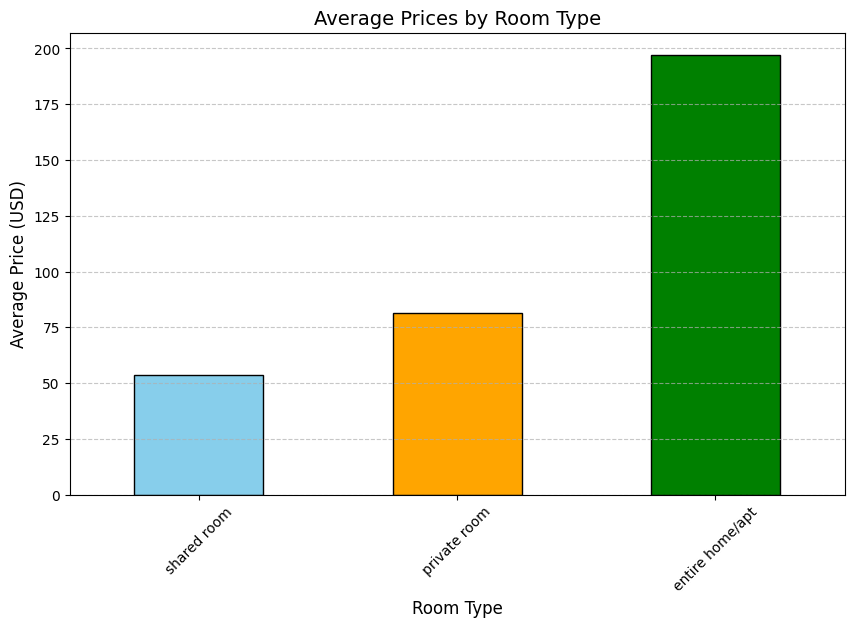

In [28]:
plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar', color=['skyblue', 'orange', 'green'], edgecolor='black')
plt.title('Average Prices by Room Type', fontsize=14)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Average Price (USD)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Trend Over Time

In [29]:
data['last_review'] = pd.to_datetime(data['last_review'], errors='coerce')

# Drop rows with invalid or missing dates
data = data.dropna(subset=['last_review'])

# Group by year and month to count the number of reviews
data['year_month'] = data['last_review'].dt.to_period('M')
reviews_per_month = data.groupby('year_month').size()

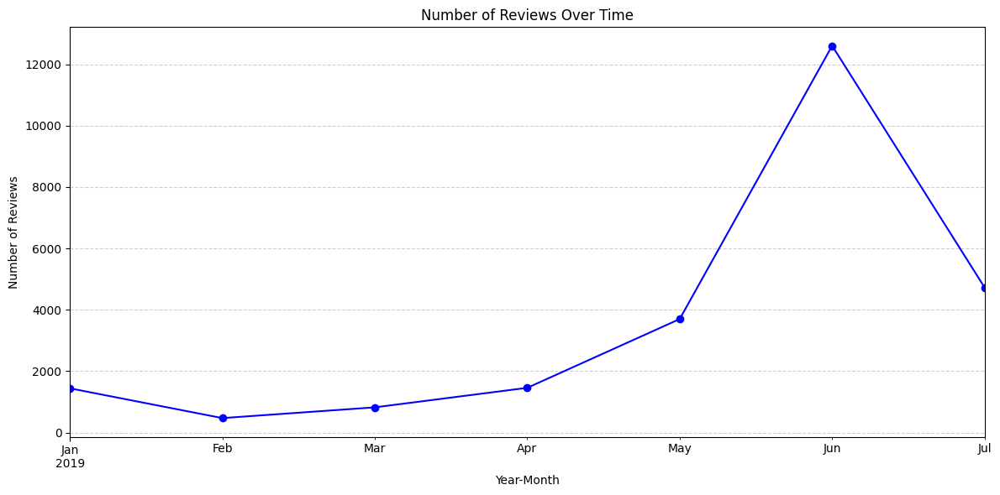

In [30]:
plt.figure(figsize=(12, 6))
reviews_per_month.plot(kind='line', marker='o', color='blue')
plt.title('Number of Reviews Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Reviews')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

### Exploring Unique Matplotlib Functions

In [31]:
data4 = pd.merge(price_data, data1, on='listing_id')

In [32]:
data4.head()

,listing_id,price,nbhood_full,price_numeric,description,room_type
0,2595,225.0,"Manhattan, Midtown",225.0,Skylit Midtown Castle,entire home/apt
1,3831,89.0,"Brooklyn, Clinton Hill",89.0,Cozy Entire Floor of Brownstone,entire home/apt
2,5099,200.0,"Manhattan, Murray Hill",200.0,Large Cozy 1 BR Apartment In Midtown East,entire home/apt
3,5178,79.0,"Manhattan, Hell's Kitchen",79.0,Large Furnished Room Near B'way,private room
4,5238,150.0,"Manhattan, Chinatown",150.0,Cute & Cozy Lower East Side 1 bdrm,entire home/apt


In [33]:
data4['description_length'] = data4['description'].str.len()

In [34]:
data4.head()

,listing_id,price,nbhood_full,price_numeric,description,room_type,description_length
0,2595,225.0,"Manhattan, Midtown",225.0,Skylit Midtown Castle,entire home/apt,21.0
1,3831,89.0,"Brooklyn, Clinton Hill",89.0,Cozy Entire Floor of Brownstone,entire home/apt,31.0
2,5099,200.0,"Manhattan, Murray Hill",200.0,Large Cozy 1 BR Apartment In Midtown East,entire home/apt,41.0
3,5178,79.0,"Manhattan, Hell's Kitchen",79.0,Large Furnished Room Near B'way,private room,31.0
4,5238,150.0,"Manhattan, Chinatown",150.0,Cute & Cozy Lower East Side 1 bdrm,entire home/apt,34.0


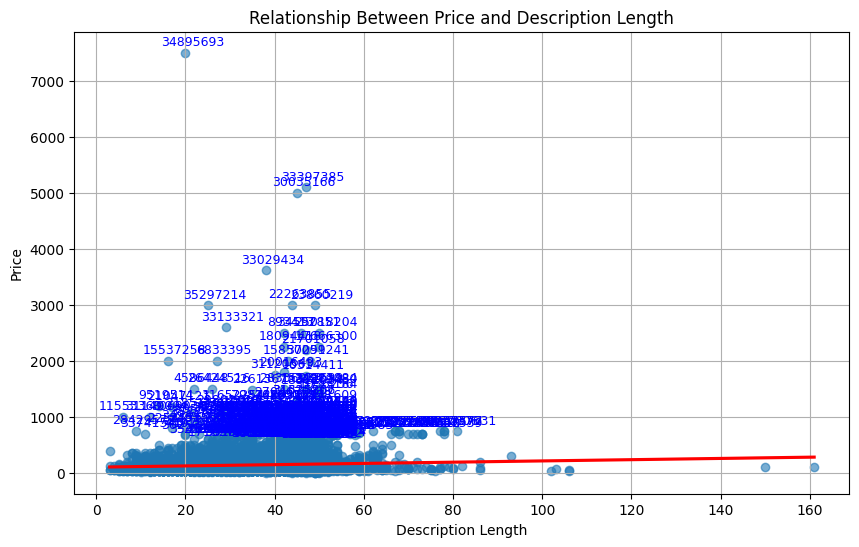

In [35]:
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.regplot(x='description_length', y='price', data=data4, scatter_kws={'alpha':0.6}, line_kws={'color': 'red'})

# Highlight and annotate outliers (e.g., where price > 500)
outliers = data4[data4['price'] > 500]
for _, row in outliers.iterrows():
    plt.annotate(
        row['listing_id'],
        (row['description_length'], row['price']),
        textcoords="offset points",
        xytext=(5, 5),
        ha='center',
        fontsize=9,
        color='blue'
    )

# Labels and title
plt.title('Relationship Between Price and Description Length')
plt.xlabel('Description Length')
plt.ylabel('Price')
plt.grid(True)
plt.show()

### Exploring Unique Seaborn Functions

F:\Yasir Py\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
F:\Yasir Py\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


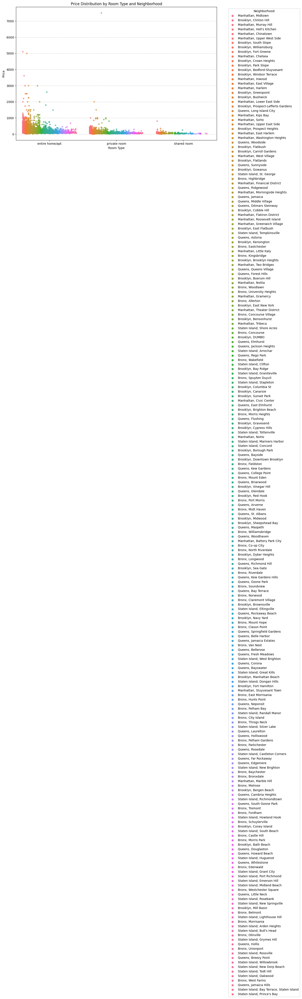

In [36]:
plt.figure(figsize=(12, 8))
sns.stripplot(x='room_type', y='price', hue='nbhood_full', data=data4, jitter=True, dodge=True, alpha=0.7)
plt.title('Price Distribution by Room Type and Neighborhood')
plt.xlabel('Room Type')
plt.ylabel('Price')
plt.legend(title='Neighborhood', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

# Visualization Questions

### Brief explanation for each part of the Visualization Questions:

1. **Bar Chart - Count of Listings by Room Type:**
   - The code creates a bar chart to display the count of listings for each room type using the `value_counts()` method on the `room_type` column. The chart is styled with a sky blue color and includes labels, a title, and a grid for better readability.

2. **Heatmap - Correlation Between Price and Review Frequency:**
   - A heatmap is generated to visualize the correlation between listing price and review frequency using the `sns.heatmap` function. The correlation matrix is calculated for the `price` and `last_review` columns, and the heatmap is annotated to show correlation values, providing insights into any potential relationships.

3. **Pie Chart - Proportion of Room Types Available:**
   - The code creates a pie chart to illustrate the proportion of different room types available, using a custom color palette for visual appeal. The chart is annotated with percentages and styled as a donut chart by adding a central circle, offering a clear view of the distribution of room types.

4. **Histogram - Distribution of Listing Prices:**
   - A histogram is plotted to show the distribution of listing prices, with prices grouped into bins of $50 increments. The histogram is styled with sky blue bars and black edges, and includes labels and a title to convey the spread of prices effectively.

5. **Violin Plot - Price Distribution Across Neighborhoods:**
   - The code generates a violin plot to compare price distributions across different neighborhoods using the `sns.violinplot` function. The plot provides a visual representation of the distribution and density of prices within each neighborhood, with labels and a title for context.

### Bar Chart

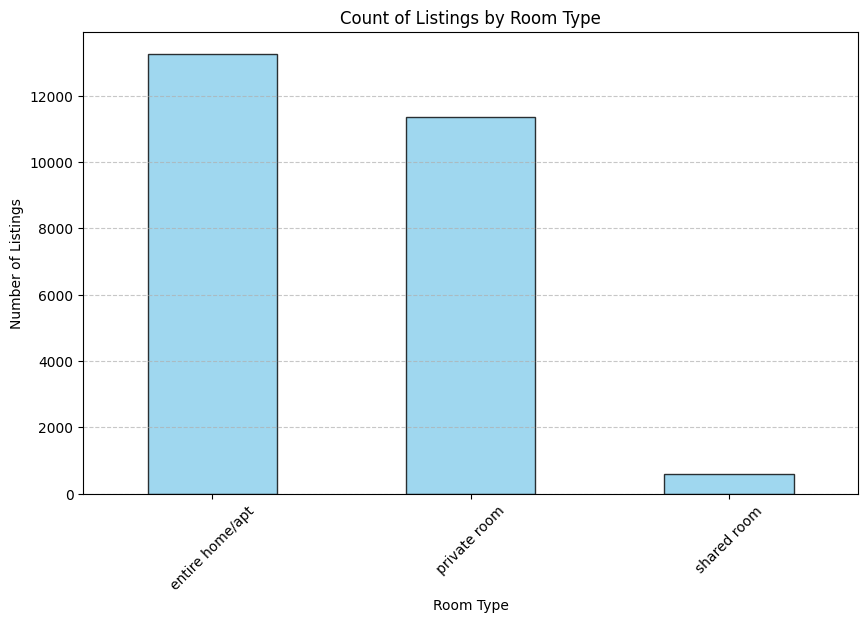

In [37]:
plt.figure(figsize=(10, 6))
data4['room_type'].value_counts().plot(kind='bar', color='skyblue', alpha=0.8, edgecolor='black')
plt.title('Count of Listings by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Number of Listings')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Heatmap

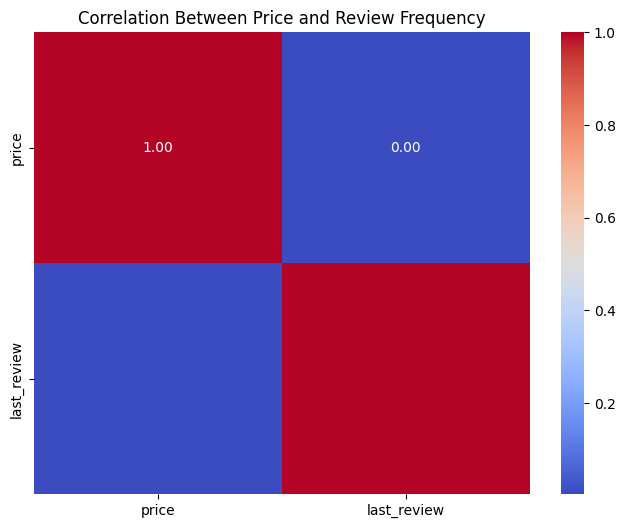

In [38]:
data5 = pd.merge(price_data, data, on='listing_id')
corr_matrix = data5[['price', 'last_review']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Between Price and Review Frequency')
plt.show()

### Pie Chart

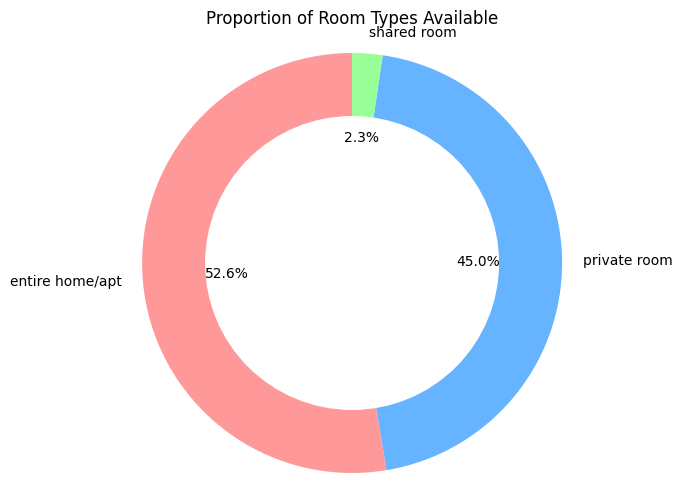

In [39]:
room_type_counts = data1['room_type'].value_counts()

# Define custom colors for the pie chart
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(room_type_counts, labels=room_type_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)

# Draw a circle at the center of pie to make it look like a donut
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')  
plt.title('Proportion of Room Types Available')
plt.show()

### Histogram

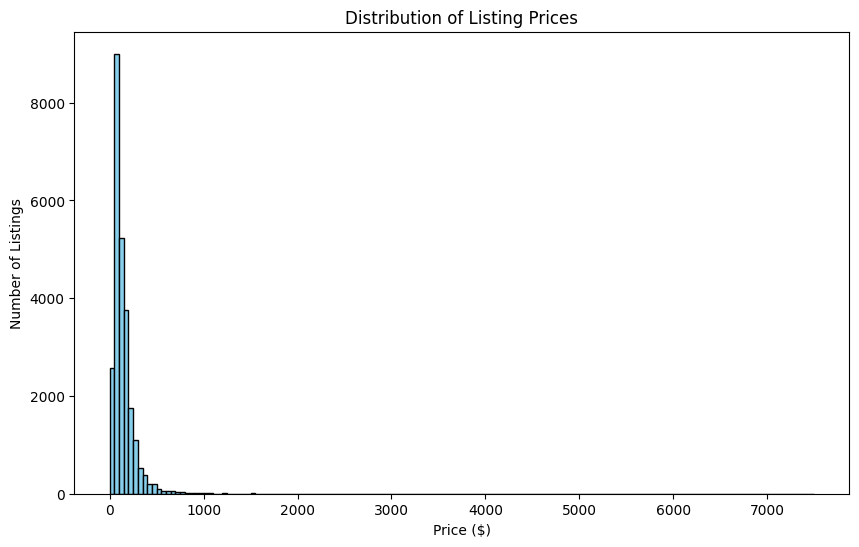

In [40]:
plt.figure(figsize=(10, 6))
plt.hist(price_data['price'], bins=range(0, int(price_data['price'].max()) + 50, 50), color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('Price ($)')
plt.ylabel('Number of Listings')
plt.title('Distribution of Listing Prices')

# Show the plot
plt.show()

### Violin Plot

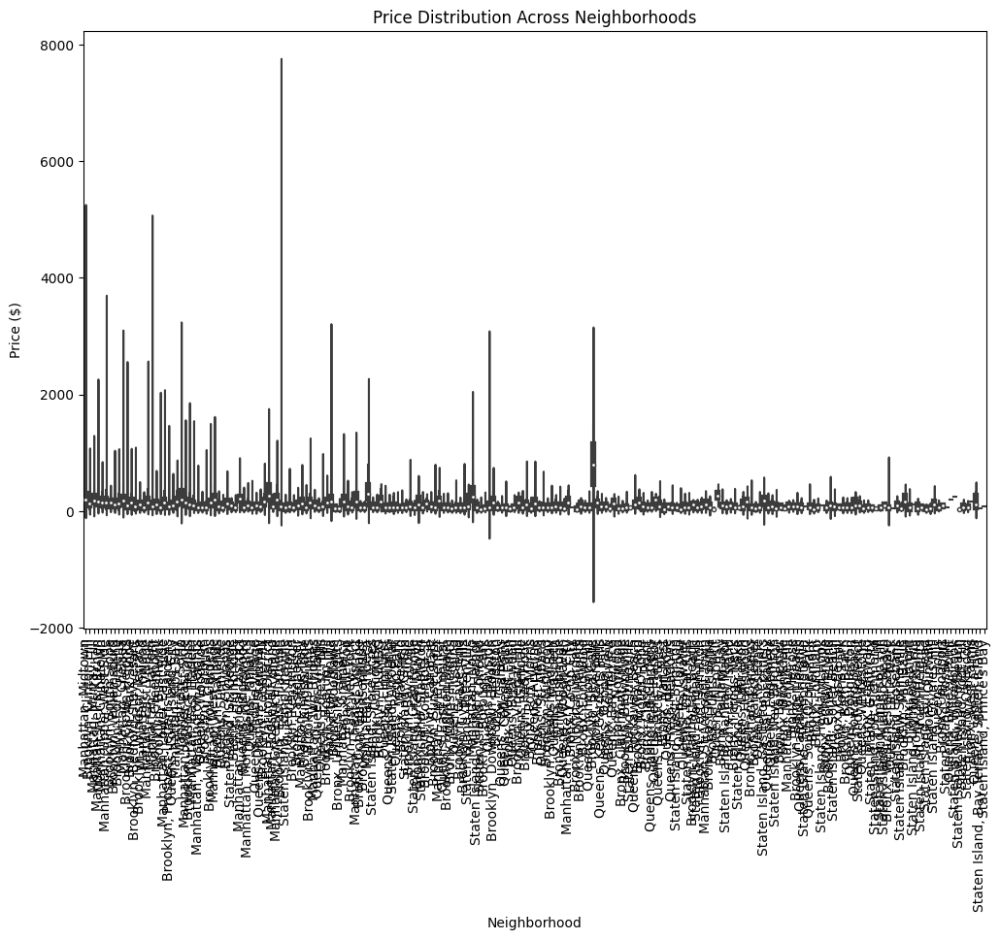

In [41]:
plt.figure(figsize=(12, 8))
sns.violinplot(x='nbhood_full', y='price', data=price_data, palette='muted')

# Add labels and title
plt.xlabel('Neighborhood')
plt.ylabel('Price ($)')
plt.title('Price Distribution Across Neighborhoods')
plt.xticks(rotation=90)
plt.show()

# Bonus Questions

### Outlier Detection

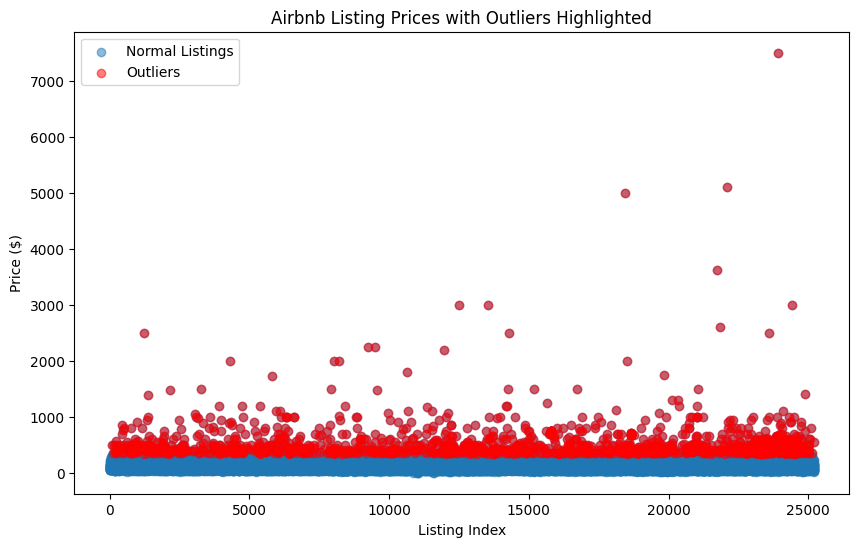

In [42]:
Q1 = price_data['price'].quantile(0.25)
Q3 = price_data['price'].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

# Determine outliers using the IQR method
outliers = price_data[(price_data['price'] < (Q1 - 1.5 * IQR)) | (price_data['price'] > (Q3 + 1.5 * IQR))]

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(price_data.index, price_data['price'], label='Normal Listings', alpha=0.5)
plt.scatter(outliers.index, outliers['price'], color='red', label='Outliers', alpha=0.5)

# Add labels and title
plt.xlabel('Listing Index')
plt.ylabel('Price ($)')
plt.title('Airbnb Listing Prices with Outliers Highlighted')
plt.legend()

# Show the plot
plt.show()

### Interactive Visualization

### Brief explanation for each part of the code:

1. **Outlier Detection - Scatter Plot:**
   - The code calculates the interquartile range (IQR) for listing prices to identify outliers, which are listings with prices significantly higher or lower than the typical range. It then creates a scatter plot where normal listings are shown in one color and outliers are highlighted in red, providing a clear visual distinction of unusual price points.

2. **Interactive Visualization - Price Trends by Neighborhood:**
   - Using Plotly, the code generates an interactive scatter plot to visualize price trends across different neighborhoods. The plot includes tooltips that display additional information such as room type and description when hovering over data points, enhancing the user's ability to explore and understand the data interactively. The layout is customized for better visualization, with axes labeled and ordered for clarity.

F:\Yasir Py\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


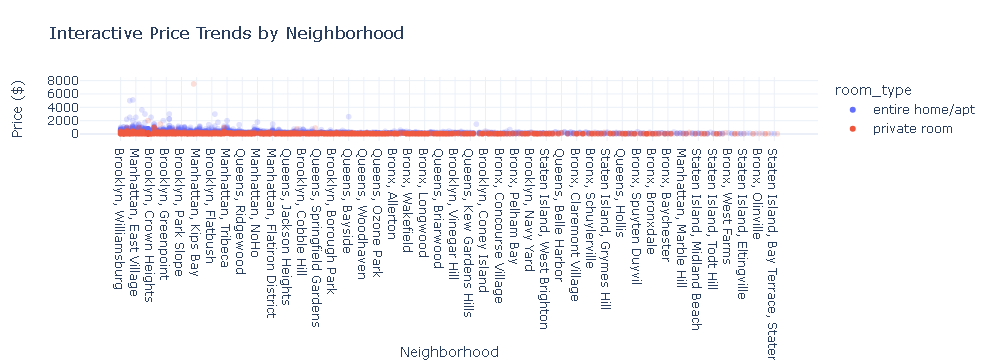

In [44]:
import plotly.express as px
fig = px.scatter(
    merged_data,
    x='nbhood_full',
    y='price',
    color='room_type',
    hover_data=['description'],
    title='Interactive Price Trends by Neighborhood',
    labels={'nbhood_full': 'Neighborhood', 'price': 'Price ($)'}
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title='Neighborhood',
    yaxis_title='Price ($)',
    xaxis={'categoryorder':'total descending'},
    template='plotly_white'
)

# Show the plot
fig.show()